# Feature engineering

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
from copy import deepcopy
import hyperopt.pyll.stochastic
from hyperopt import fmin, tpe, hp
from hyperopt import STATUS_OK, Trials
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer
from sklearn.preprocessing import StandardScaler
import matplotlib.image as img
from random import randint
import pickle
from PIL import Image
import cv2 # pip install opencv-python
from imutils import paths  #pip install imutils
from random import shuffle 

### Description of dataset and short overview

Dataset was selected from an ongoing Kaggle competition: https://www.kaggle.com/c/petfinder-pawpularity-score . The goal of the competition was to predict a pet's 'pawpularity' score (float) based on its image (jpg file) and tabular metadata (12 binary features, originally hand-labelled). The images and scores originated from a website that helps homeless pets to find new owners. The scores had been calculated from each pet profile's page view statistics. 

We first tried using only the metadata, but this did not give good results. Therefore, we decided to engineer new floating point features from the images (like brightness, resolution, etc. as well as percentage of image area covered by each of 16 different colors).

In this notebook, we do feature engineering of those added features. In the next notebooks, we use Hyperopt on those features (together with the original binary features), and finally we experiment with hyperopt with neural networks (resnet) on the images themselves.

In [4]:
# Load data:

#path_to_data = "petfinder-pawpularity-score//"
path_to_data = "input//"
path_to_pics = path_to_data + "train//"

data = pd.read_csv(path_to_data + "train.csv", sep=',',  encoding='utf-8') # index_col=0,
#data = pd.read_csv(path_to_data + "train2.csv", sep=',',  encoding='utf-8') 

pics = os.listdir(path_to_pics)
data.head()

,Id,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
0,0007de18844b0dbbb5e1f607da0606e0,0,1,1,1,0,0,1,0,0,0,0,0,63
1,0009c66b9439883ba2750fb825e1d7db,0,1,1,0,0,0,0,0,0,0,0,0,42
2,0013fd999caf9a3efe1352ca1b0d937e,0,1,1,1,0,0,0,0,1,1,0,0,28
3,0018df346ac9c1d8413cfcc888ca8246,0,1,1,1,0,0,0,0,0,0,0,0,15
4,001dc955e10590d3ca4673f034feeef2,0,0,0,1,0,0,1,0,0,0,0,0,72


**If you only want to do plotting the images later in the code, without running the feature adding methods, you can load the dataset with already added features from here (then you only also need to run the plotting function below):**

In [24]:
#data = pd.read_csv(path_to_data + "train2.csv", sep=',',  encoding='utf-8') 

# Histograms of existing binary features

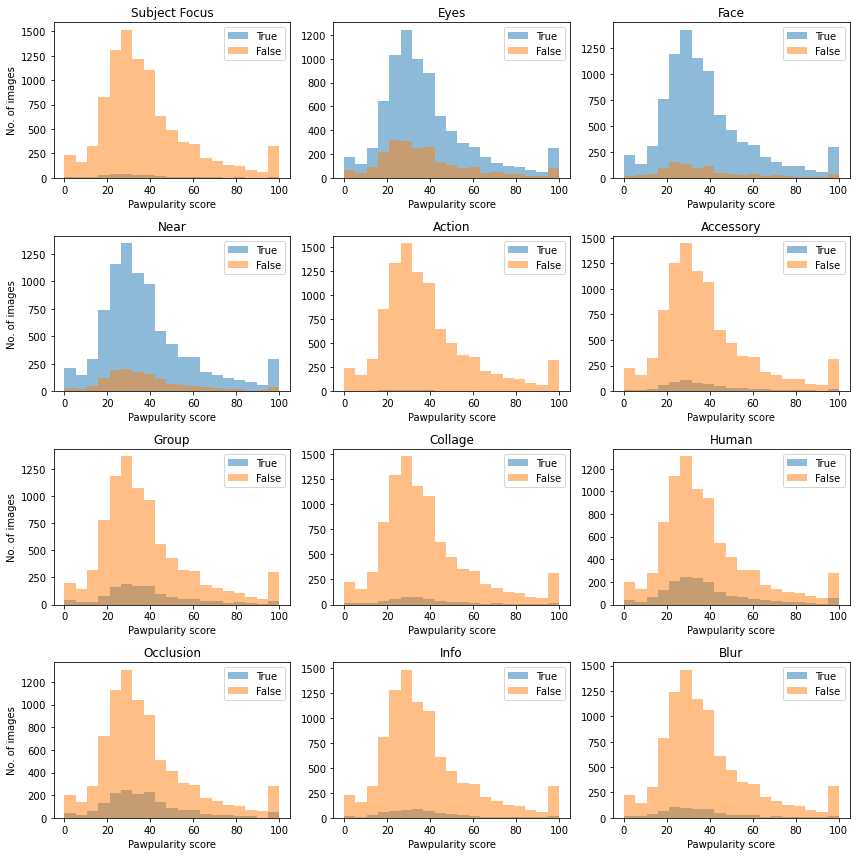

In [23]:
X = data.drop(columns = ['Id'])  #, 'Pawpularity'
cols = X.columns.tolist()

plt.rcParams['figure.figsize'] = (12.0, 12.0)

for i in range(len(cols)-1):
    col = cols[i]
    plt.subplot(4, 3, i+1)
    pos = X[X[col]==1]['Pawpularity']
    neg = X[X[col]==0]['Pawpularity']
    bins = np.linspace(0, 100, 20)
    plt.hist(pos, bins, alpha=0.5, label='True')
    plt.hist(neg, bins, alpha=0.5, label='False')   
    plt.title(col) 
    plt.legend(loc='upper right')
    if i in [0, 3, 6, 9]:
        plt.ylabel('No. of images')
    #if i in [9, 10, 11]:
    plt.xlabel('Pawpularity score')
    plt.tight_layout()
plt.show()

We can see that in case of all existing features, one of the two possible values occurs very rarely compared to the other one. Also, we can see that in case of all features, the distribution of 'pawpularity' scores of images having one feature value do not seem to differ from distribution of 'pawpularity' scores of images having the other feature value. 

We hoped that perhaps feature engineering could help to define some more meaningful features.  

## Some example images

In [34]:
def load_pic(idx, path_to_pics):
    return img.imread(path_to_pics + pics[idx])

def load_pic2(idx, path_to_pics):
    return Image.open(path_to_pics + pics[idx])

def load_pic3(idx, path_to_pics, rgb):
    pic = cv2.imread(path_to_pics + pics[idx])
    if rgb==True:
        pic = cv2.cvtColor(pic, cv2.COLOR_BGR2RGB) # convert BRG to RGB
    return pic
   
def show_10_pics(path_to_pics, pics, data, col, labels):
    plt.rcParams['figure.figsize'] = (14.0, 7.0)
    color_cols = ['white', 'light_grey', 'grey', 'black', 'brown',
                  'orange', 'green', 'lime', 'dark_green', 'cyan', 'teal', 'blue',
                  'violet', 'purple', 'dark_red', 'red']
    if col=='random':
        pics_idx = [randint(0, len(pics)-1) for x in range(10)]
    elif col=='specific':
        pics_idx = labels
    elif col in color_cols:
        col_values = data.sort_values(by=[col], ascending = False)[col]
        pics_idx = col_values[:10].index.tolist()
    else:
        col_values = data.sort_values(by=[col])[col]
        min_values = col_values[:5].index.tolist()
        max_values = col_values[-5:].index.tolist()
        pics_idx = min_values + max_values
        
    for i in range(1,11):
        plt.subplot(2, 5, i)
        if col in color_cols:
            if i==1:
                plt.title(labels[0])
        elif col not in ('random', 'specific'):
            if i==1:
                plt.title(labels[0])
            elif i==6:
                plt.title(labels[1])
        pic_rgb = load_pic(pics_idx[i-1], path_to_pics)
        # plt.imshow(pic_rgb, plt.get_cmap('gray'))
        plt.imshow(pic_rgb)
        plt.axis('off')

**Sample image:**

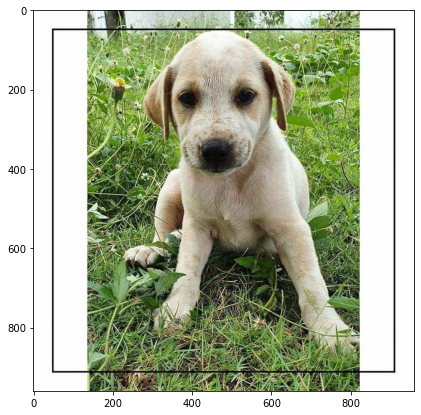

In [18]:
pic = load_pic(30, path_to_pics) 
plt.imshow(pic)

**10 random images:**

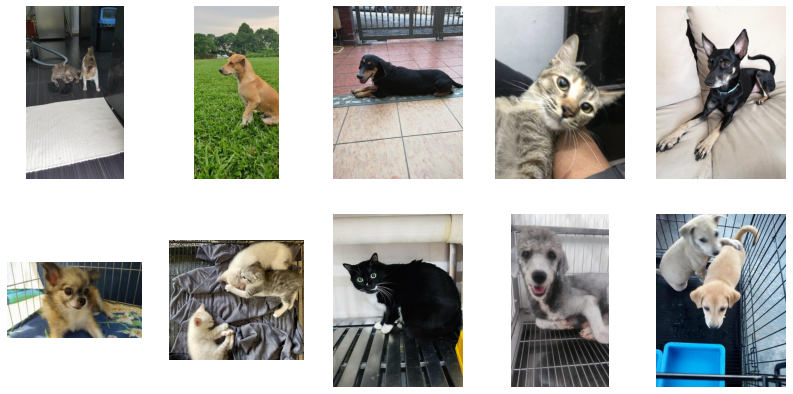

In [15]:
show_10_pics(path_to_pics, pics, data, 'random', None)

**10 images from amongst the most popular ones:**

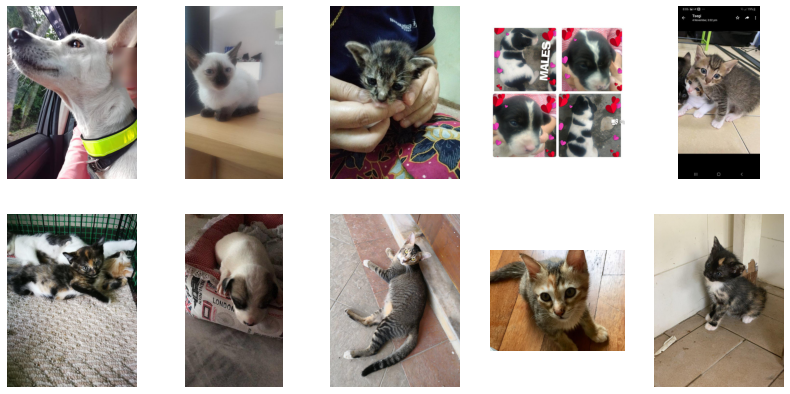

In [74]:
most_popular = data[data['Pawpularity']==100] # ['Pawpularity'].index.tolist()
show_10_pics(path_to_pics, pics, most_popular, 'random', None)

**10 images from amongst the least popular ones:**

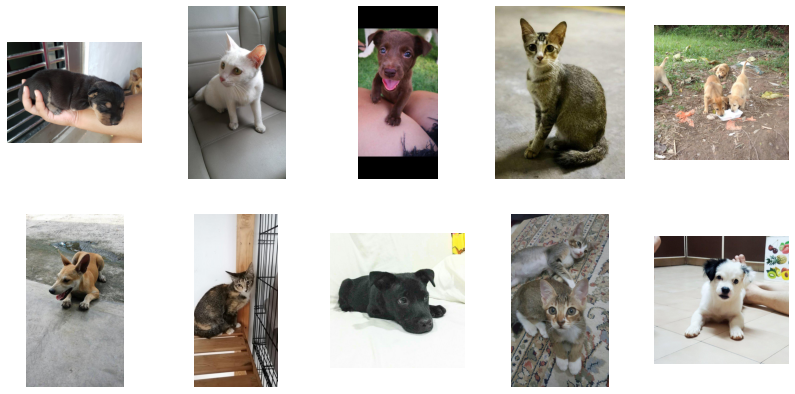

In [17]:
least_popular = data[data['Pawpularity']<3] 
show_10_pics(path_to_pics, pics, least_popular, 'random', None)

It does not seem obvious at all what distinguishes the most popular images from the least popular ones. 

Text(0.5, 1.0, 'Distribution of pet popularity')

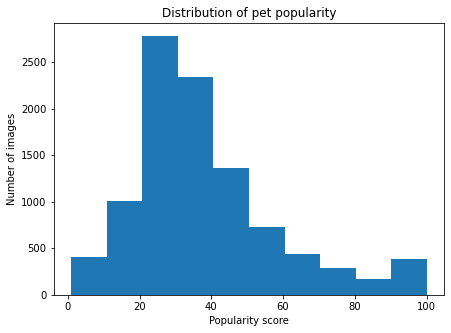

In [22]:
# Histogram of popularity values:
plt.rcParams['figure.figsize'] = (7,5)
plt.hist(data['Pawpularity'])
plt.xlabel('Popularity score')
plt.ylabel('Number of images')
plt.title('Distribution of pet popularity')

# ADDING FEATURES:

## DPI AND ASPECT RATIO (also height and width):

In [ ]:
def calc_metrics(pics, path_to_pics):
    heights, widths = [], []
    aspect_ratios = []  # height/width
    DPIs = [] # density per inch (resolution) - assuming that longest dimension is 4 inches long
    # sizes = [] # measured by area (an alternative could be average of width and length.); not very informative, because images are resized on screen
    # diagonals = [] # did not give good results- it mainly distinguished images that were square vs elongated, which is also described by aspect ratio 
    for i in range(len(pics)):
        pic = load_pic(i, path_to_pics)
        
        height, width = pic.shape[0], pic.shape[1]
        aspect_ratio = height/width
        # img_size = height*width 
        # diagonal = np.sqrt(height**2 + width**2)
        dpi = int(np.max([height, width])/4)
        
        heights.append(height)
        widths.append(width)
        aspect_ratios.append(aspect_ratio) 
        # sizes.append(img_size) 
        # diagonals.append(diagonal)
        DPIs.append(dpi) 
        
    return [heights, widths, aspect_ratios, DPIs]

results = calc_metrics(pics, path_to_pics)
data['height'] = results[0] # probably better to use aspect ratio instead
data['width'] = results[1] # probably better to use aspect ratio instead
data['aspect_ratio'] = results[2]
# data['img_size'] = results[3]
# data['diagonal'] = results[3]
data['dpi'] = results[3]

**Images with smallest and largest aspect ratio:**

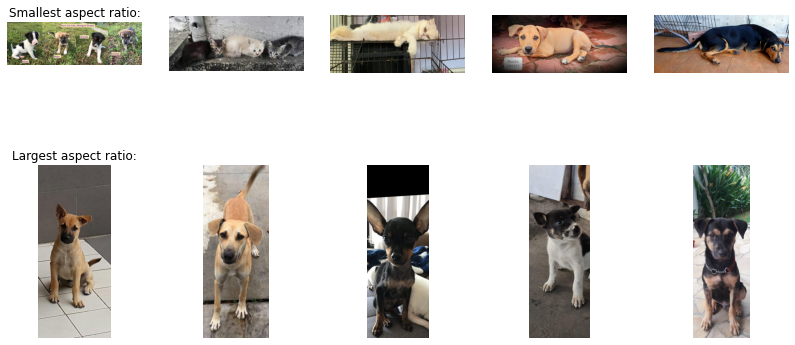

In [25]:
show_10_pics(path_to_pics, pics, data, 'aspect_ratio', ['Smallest aspect ratio:', 'Largest aspect ratio:']) 
# - this also shows if image is in portrait or landscale mode

**Images with smallest and largest resolution:**

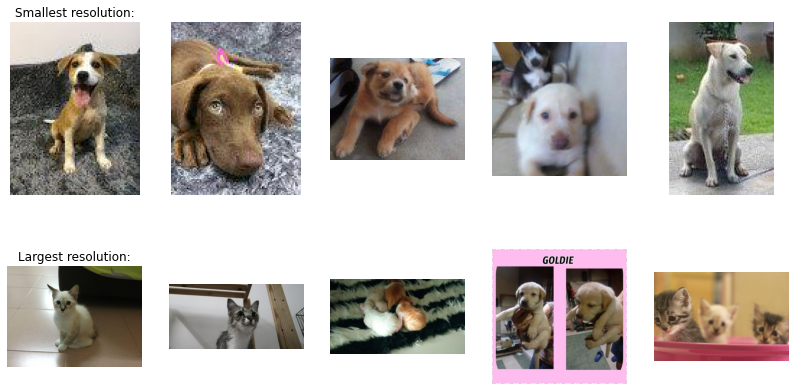

In [26]:
show_10_pics(path_to_pics, pics, data, 'dpi', ['Smallest resolution:', 'Largest resolution:']) 
# -> The usefulness of this really depends on how large images were displayed to people who evaluated the pawpularity score. 

## BLUR
 - https://www.pyimagesearch.com/2015/09/07/blur-detection-with-opencv/

In [ ]:
def calc_blur(pics, path_to_pics):
    blurs = []
    for i in range(len(pics)):
        pic = load_pic3(i, path_to_pics, True)
        gray = cv2.cvtColor(pic, cv2.IMREAD_GRAYSCALE) # convert to grayscale
        blur = cv2.Laplacian(gray, cv2.CV_64F).var() # variance of laplacian
        blurs.append(blur)
        # 	if blur < 100  -> is blurry 
    return [blurs]

results = calc_blur(pics, path_to_pics)
data['blur'] = results[0]

**Most and least blurry images:**

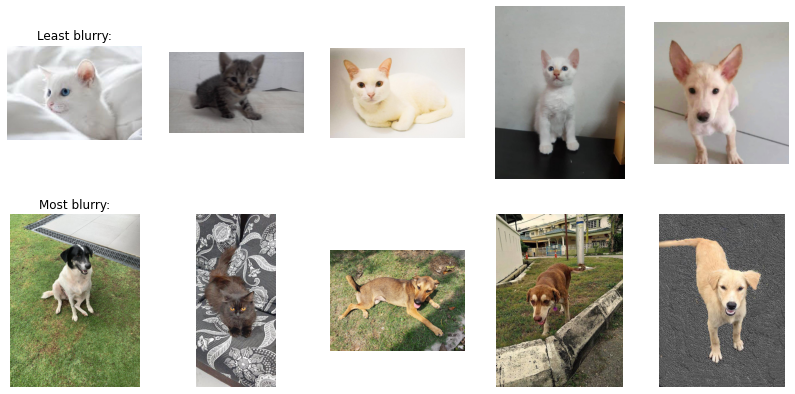

In [28]:
show_10_pics(path_to_pics, pics, data, 'blur', ['Least blurry:', 'Most blurry:']) 

## HUE, SATURATION, BRIGHTNESS 

In [ ]:
def hsv_colors(pics, path_to_pics):
    red, yellow, green, cyan, blue, magenta = [], [], [], [], [], []
    saturation, brightnesses, hues = [], [], []
    for i in range(len(pics)):
        pic = load_pic3(i, path_to_pics, False)
        pic2 = cv2.cvtColor(pic, cv2.COLOR_BGR2HSV) # convert  RGB to HSV
        h,s,v = cv2.split(pic2)  # (720, 405)
                
        # Hue, saturation and brightness:
        tot = s.shape[0]*s.shape[1]
        s = s.reshape(tot)
        h = h.reshape(tot)
        v = v.reshape(tot)
        # saturation.append(np.mean(s))
        saturation.append(np.mean(s)/255)
        brightnesses.append(np.mean(v)/255)
        hues.append(np.mean(h)/255)
 
    result = pd.DataFrame(data = [saturation, brightnesses, hues]).T
    result.columns = ['saturation', 'brightness', 'hue']
    return result

result = hsv_colors(pics, path_to_pics)
data = pd.concat([data, result], axis=1)

**Images with smallest and largest saturation:**

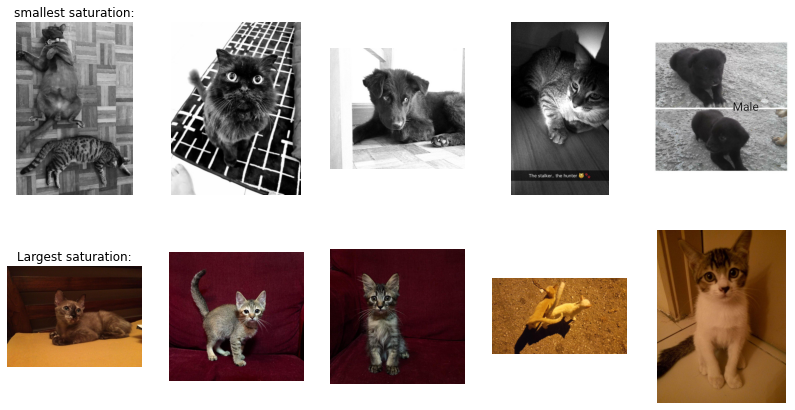

In [29]:
show_10_pics(path_to_pics, pics, data, 'saturation', ['smallest saturation:', 'Largest saturation:'])

**Images with smallest and largest brightness:**

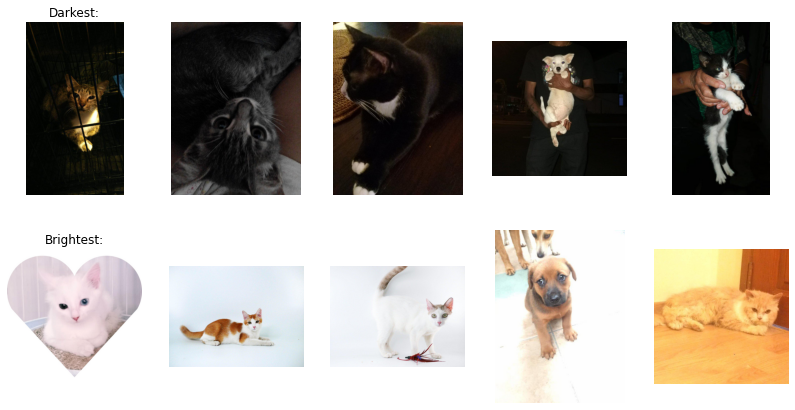

In [30]:
show_10_pics(path_to_pics, pics, data, 'brightness', ['Darkest:', 'Brightest:']) 

**Images with smallest and largest hue:**

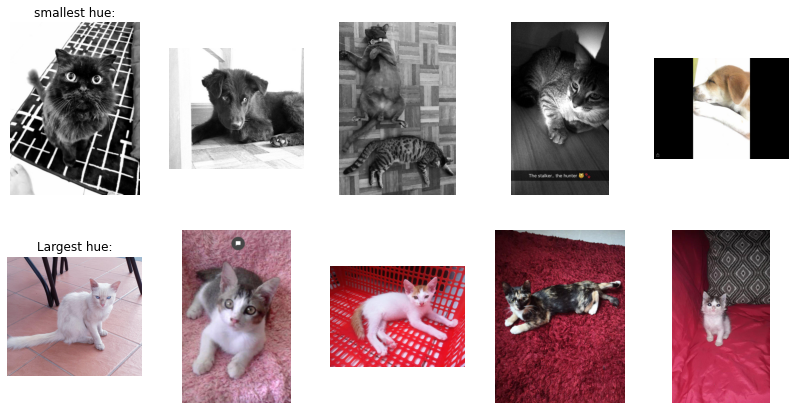

In [31]:
show_10_pics(path_to_pics, pics, data, 'hue', ['smallest hue:', 'Largest hue:'])

In [ ]:
## show_10_pics(path_to_pics, pics, data, 'specific', [x for x in range(10)])

## COLORS

The color features that are added below show the percentage of image area that is colored with each of 16 different colors. We will plot 10 images that have the largest percentage of each color.

In [ ]:
# - mapping based on: 
# https://en.wikipedia.org/wiki/Web_colors#HTML_color_names

def map_colors2(h, s, v):  # h = hue layer
    tot = h.shape[0]*h.shape[1]
    h = h.reshape(tot)
    s = s.reshape(tot)/255
    v = v.reshape(tot)/255
     
    #hue ranges:
    h30 = h<30
    h60 = np.logical_and(h<60, h>=30)
    h90 = np.logical_and(h<90, h>=60)
    h120 = np.logical_and(h<120, h>=90)
    h150 = np.logical_and(h<150, h>=120)
    h180 = h>=150 
        
    # saturation ranges:
    s0 = s<0.5
    s100 = s>=0.5
    
    # brightness ranges:
    # v0 = v<0.25
    v50 = np.logical_and(v>=0.25, v<0.63)
    v75 = np.logical_and(v>=0.63, v<0.86)
    # v100 = v>=0.86
    v50b = v<0.5
    v100b = v>=0.5    
    
    # Combinations:
    s0_h0 = h30 & s0 # np.logical_and(h30, s0)
    s100_v50 = s100 &  v50b # np.logical_and(s100, v50b)
    s100_v100 = s100 & v100b # np.logical_and(s100, v100b)
    
    # colors:    
    white = np.sum(np.logical_and(s0_h0, v>=0.86))
    light_grey = np.sum(np.logical_and(s0_h0, v75))
    grey = np.sum(np.logical_and(s0_h0, v50))
    black = np.sum(np.logical_and(s0_h0, v<0.25))
    red = np.sum(np.logical_and(h30, s100_v50))
    maroon = np.sum(np.logical_and(h30, s100_v100))
    yellow = np.sum(np.logical_and(h60, s100_v50))
    olive = np.sum(np.logical_and(h60, s100_v100))
    lime = np.sum(np.logical_and(h90, s100_v50))
    green = np.sum(np.logical_and(h90, s100_v100))
    acqua = np.sum(np.logical_and(h120, s100_v50))
    teal = np.sum(np.logical_and(h120, s100_v100))
    blue = np.sum(np.logical_and(h150, s100_v50))
    navy = np.sum(np.logical_and(h150, s100_v100))
    fucshia = np.sum(np.logical_and(h180, s100_v50))
    purple = np.sum(np.logical_and(h180, s100_v100)) 
    
    colors_tot = np.array([white, light_grey, grey, black, red, maroon, yellow, olive, lime, green, acqua, teal, blue, navy, fucshia, purple])

    colors_perc = colors_tot/np.sum(colors_tot)

    return colors_perc


def hsv_colors2(pics, path_to_pics):
    mappings = []
    for i in range(len(pics)):
        pic = load_pic3(i, path_to_pics, False)
        pic2 = cv2.cvtColor(pic, cv2.COLOR_BGR2HSV) # convert  RGB to HSV
        h,s,v = cv2.split(pic2)  # (720, 405)
        mapping = map_colors2(h, s, v)
        mappings.append(mapping)

    result = pd.DataFrame(data = mappings)
    result.columns = ['white', 'light_grey', 'grey', 'black',
                  'brown', 'orange', 'green', 'lime', 
                  'dark_green', 'cyan', 'teal', 'blue',
                  'violet', 'purple', 'dark_red', 'red']
    
    return result

result = hsv_colors2(pics, path_to_pics)
data = pd.concat([data, result], axis=1)

**Images with different dominating colors:**

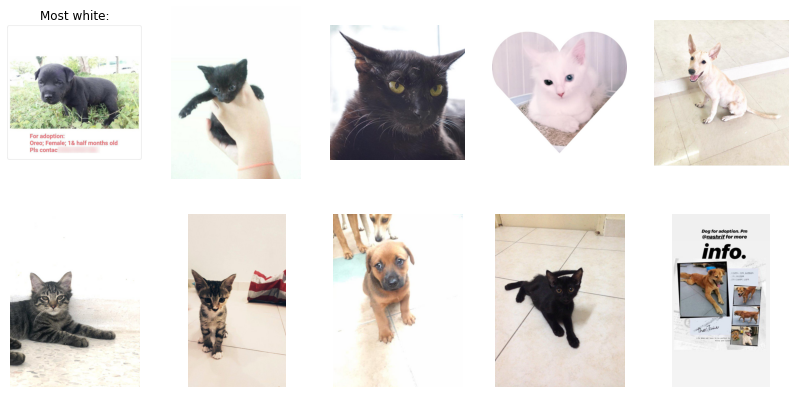

In [35]:
show_10_pics(path_to_pics, pics, data, 'white', ['Most white:'])

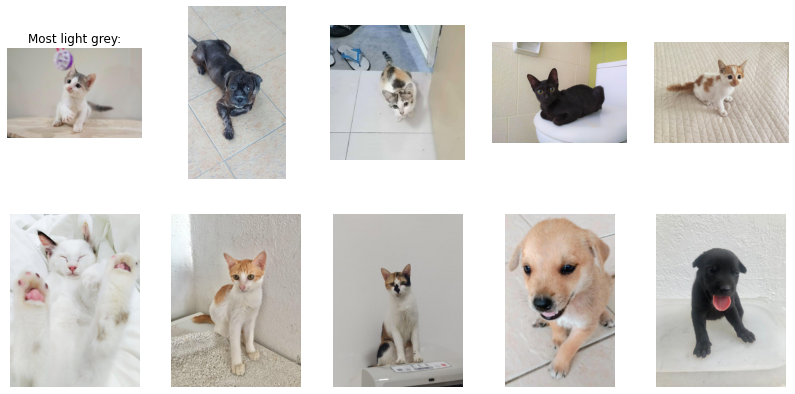

In [36]:
show_10_pics(path_to_pics, pics, data, 'light_grey', ['Most light grey:'])

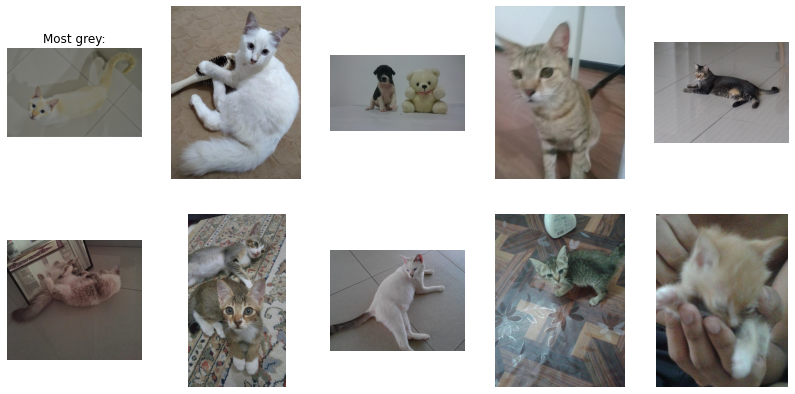

In [37]:
show_10_pics(path_to_pics, pics, data, 'grey', ['Most grey:'])

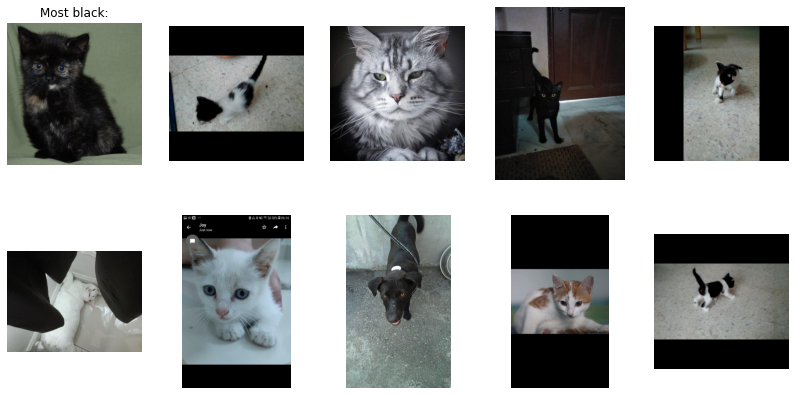

In [38]:
show_10_pics(path_to_pics, pics, data, 'black', ['Most black:'])

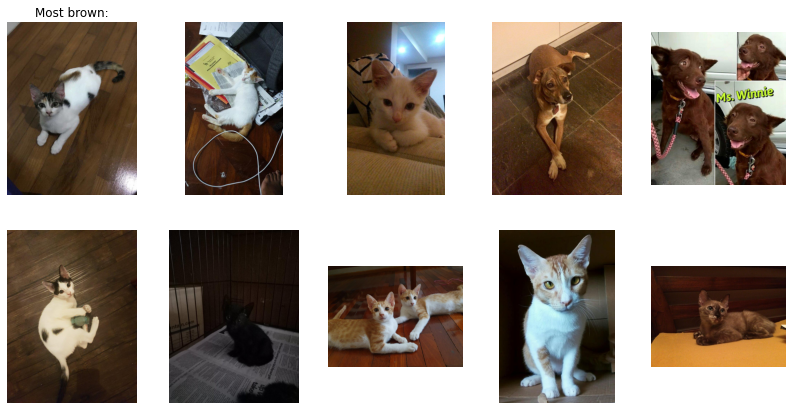

In [39]:
show_10_pics(path_to_pics, pics, data, 'brown', ['Most brown:']) 

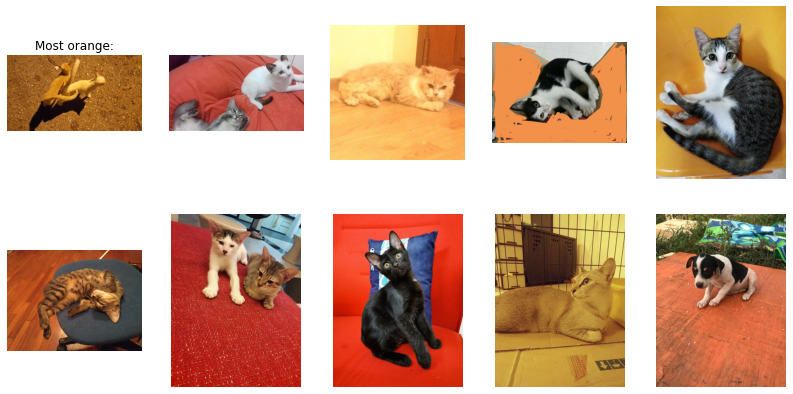

In [40]:
show_10_pics(path_to_pics, pics, data, 'orange', ['Most orange:'])

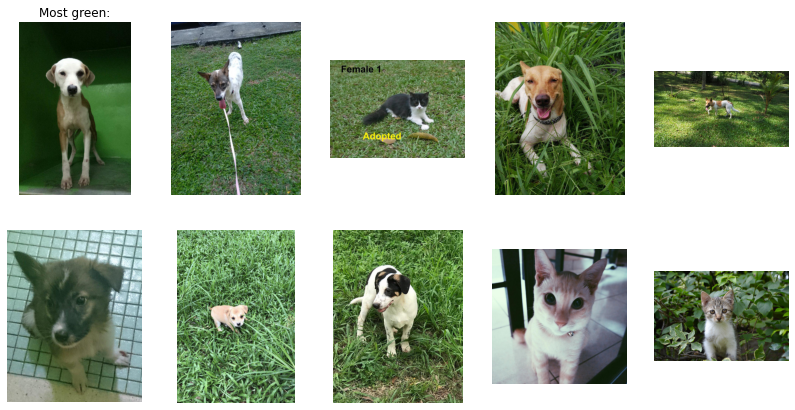

In [41]:
show_10_pics(path_to_pics, pics, data, 'green', ['Most green:']) 

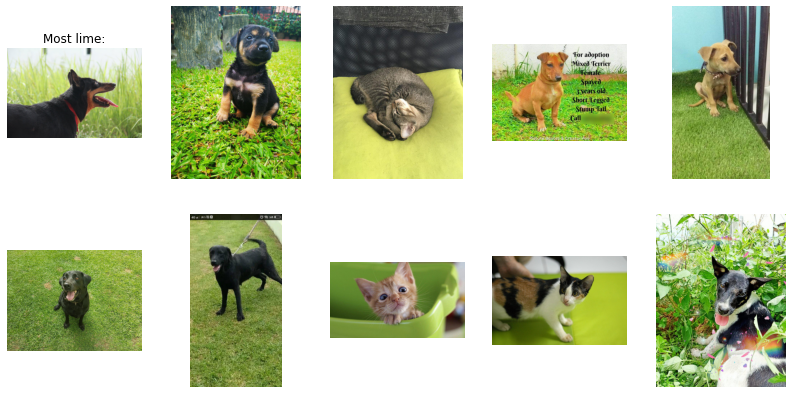

In [42]:
show_10_pics(path_to_pics, pics, data, 'lime', ['Most lime:']) 

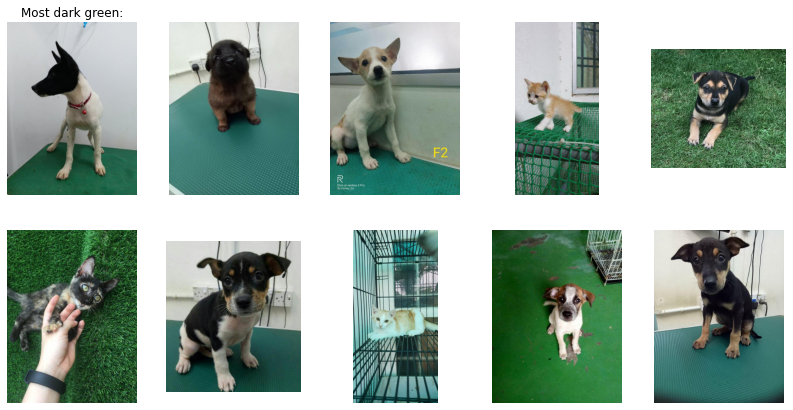

In [43]:
show_10_pics(path_to_pics, pics, data, 'dark_green', ['Most dark green:'])

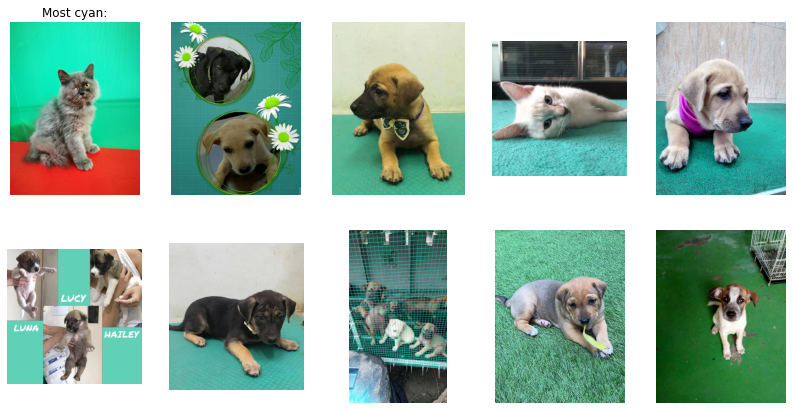

In [44]:
show_10_pics(path_to_pics, pics, data, 'cyan', ['Most cyan:']) 

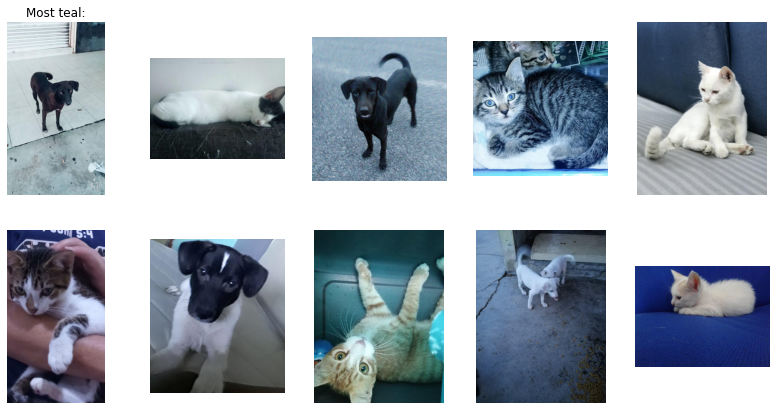

In [45]:
show_10_pics(path_to_pics, pics, data, 'teal', ['Most teal:']) 

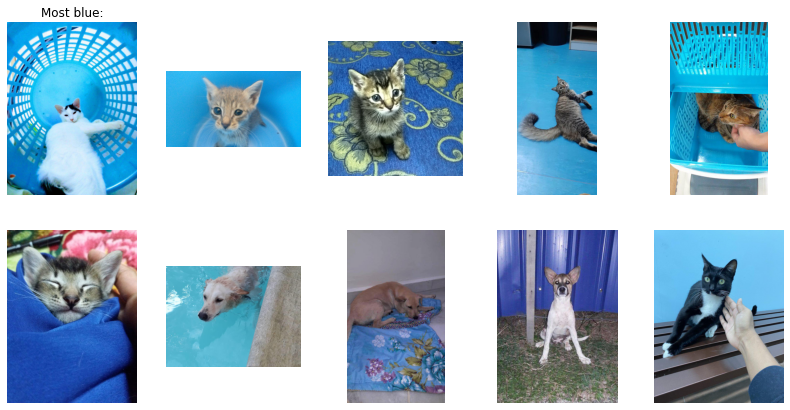

In [46]:
show_10_pics(path_to_pics, pics, data, 'blue', ['Most blue:']) 

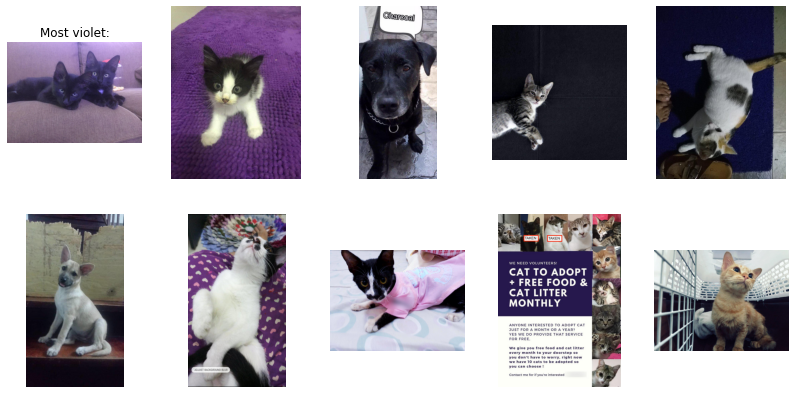

In [47]:
show_10_pics(path_to_pics, pics, data, 'violet', ['Most violet:'])

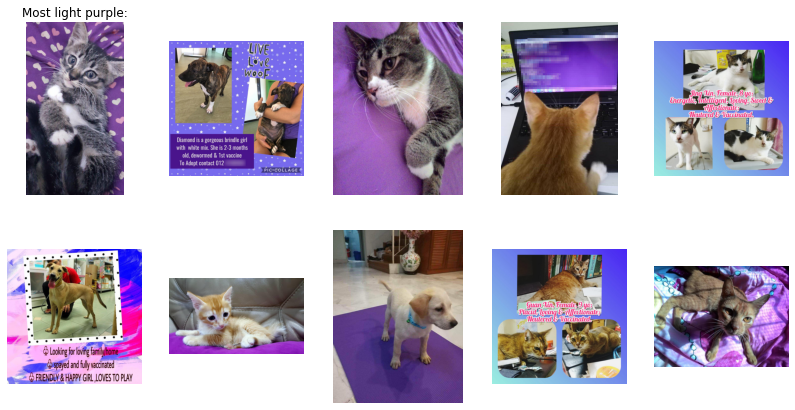

In [48]:
show_10_pics(path_to_pics, pics, data, 'purple', ['Most light purple:']) 

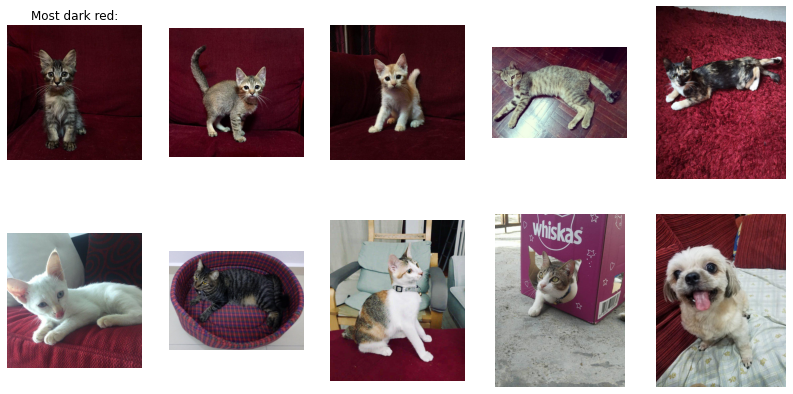

In [49]:
show_10_pics(path_to_pics, pics, data, 'dark_red', ['Most dark red:']) 

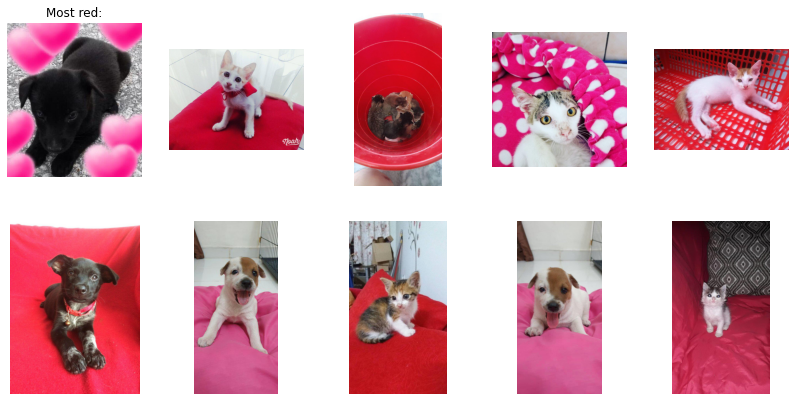

In [50]:
show_10_pics(path_to_pics, pics, data, 'red', ['Most red:']) 

## WARMTH

- https://forum.image.sc/t/how-to-calculate-measure-the-color-temperature-of-an-image/50359
- https://dsp.stackexchange.com/questions/8949/how-to-calculate-the-color-temperature-tint-of-the-colors-in-an-image

In [ ]:
def calc_warmth(pics, path_to_pics):
    warmths = []
    for i in range(len(pics)):
        pic = load_pic(i, path_to_pics)
        r, g, b = pic[:,:,0], pic[:,:,1], pic[:,:,2]
        r_mean = np.mean(r)
        g_mean  =np.mean(g)
        b_mean  =np.mean(b)
        
        # Convert RGB to CIE tristimulus values
        # See also: https://en.wikipedia.org/wiki/CIE_1931_color_space
        X=(-0.14282*r_mean)+(1.54924*g_mean)+(-0.95641*b_mean)
        Y=(-0.32466*r_mean)+(1.57837*g_mean)+(-0.73191*b_mean)
        Z=(-0.68202*r_mean)+(0.77073*g_mean)+(0.56332*b_mean)
        
        # Calculate Normalized Chromacity Values
        Normx=X/(X+Y+Z)
        Normy=Y/(X+Y+Z)
        
        # compute CCT values
        n=(Normx-0.3320)/(0.1858-Normy)
        CCT=449*(n**3)+3525*(n**2)+6823.3*n+5520.33
        warmths.append(CCT)
    return warmths

result = calc_warmth(pics, path_to_pics)
data['warmth'] = result

# Trim values of outliers:
# - 3 images had large negative value (all others were positive) -> trim those to zero:
a = data['warmth']<0
data['warmth'] = data['warmth'].where(-a, 0)

# - A few had very large positive values (way out of range) -> trim those to 25000
a = data['warmth']>25000
data['warmth'] = data['warmth'].where(-a, 25000)

**Images with warmest / coldest colors:**

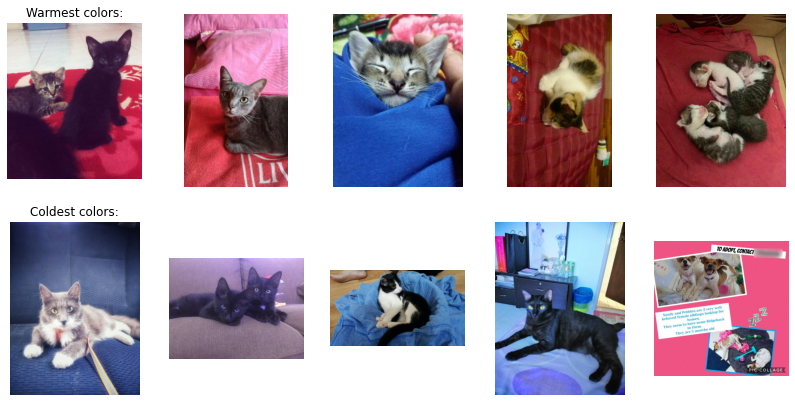

In [51]:
show_10_pics(path_to_pics, pics, data, 'warmth', ['Warmest colors:', 'Coldest colors:'])

# CONTRAST:
    
Contrast can be calculated in several ways.
- one way: st.dev. of grayscale image:
  https://stackoverflow.com/questions/58821130/how-to-calculate-the-contrast-of-an-image
  
- another way: contrast = (Ymax-Ymin)/(Ymax+Ymin) -> using this formula, calculate contrast for small neighbourhood around each pixel, then average:
  https://stackoverflow.com/questions/57256159/how-extract-contrast-level-of-a-photo-opencv

In [ ]:
def calc_contrast(pics, path_to_pics):
    contrasts = []
    contrasts2 = []
    for i in range(len(pics)):
        pic = load_pic3(i, path_to_pics, False)
 
        # --------------------------
        # By using standard deviation:
        pic2 = cv2.cvtColor(pic, cv2.IMREAD_GRAYSCALE) 
        # pic2 = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY) 
        contrast = pic2.std()
        contrasts.append(contrast)
                
        # --------------------------
        # By examining small neighbourhood around each pixel, then average:
        lab = cv2.cvtColor(pic, cv2.COLOR_BGR2LAB) 
        L, A, B=cv2.split(lab) # separate channels

        # compute minimum and maximum in 5x5 region using erode and dilate
        # - erode and dilate for NxN element are equivalent to min and max.
        kernel = np.ones((5,5), np.uint8)
        min_ = cv2.erode(L, kernel, iterations = 1)
        max_ = cv2.dilate(L, kernel, iterations = 1)
        min_ = min_.astype(np.float64) 
        max_ = max_.astype(np.float64) 
        contrast = (max_-min_)/(max_+min_) # compute local contrast
        average_contrast = np.nanmean(contrast)  # get average across whole image, ignoring nans
        contrasts2.append(average_contrast)
        
    return [contrasts, contrasts2]

result = calc_contrast(pics, path_to_pics)

data['contrast'] = result[0]
data['contrast2'] = result[1]

**Images with smallest and largest contrast:**

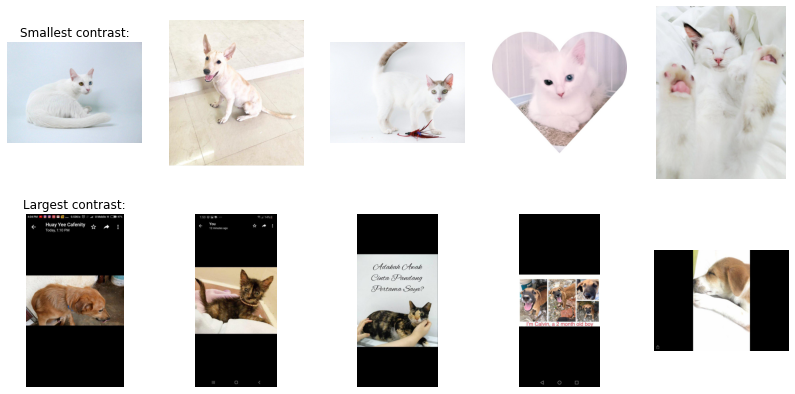

In [52]:
show_10_pics(path_to_pics, pics, data, 'contrast', ['Smallest contrast:', 'Largest contrast:'])

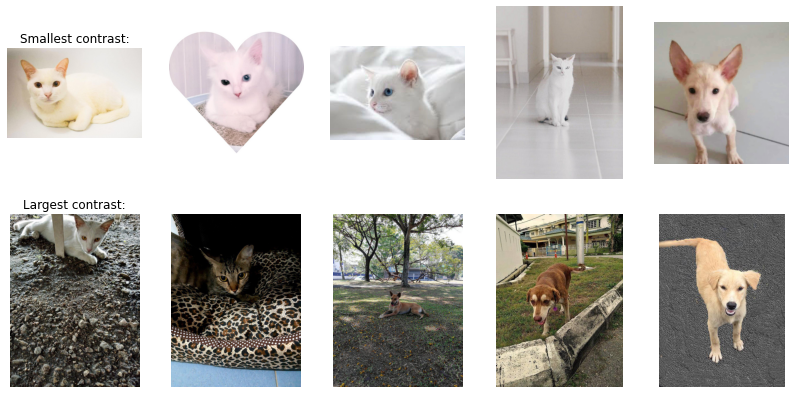

In [53]:
show_10_pics(path_to_pics, pics, data, 'contrast2', ['Smallest contrast:', 'Largest contrast:'])

# SCATTERPLOTS OF ADDED FEATURES:

In [58]:
def make_scatterplot(data, cols, labels):
    plt.rcParams['figure.figsize'] = (14.0, 4.0)
    for i in range(1,4):
        plt.subplot(1, 3, i)        
        plt.scatter(data[cols[i-1]], data['Pawpularity'], alpha = 0.3)
        if i==1:
            plt.ylabel('Popularity score')
        plt.xlabel(labels[i-1])
        # plt.title(labels[i-1] + " vs pawpularity")
    plt.show()

**Aspect ratio, DPI and blur:**

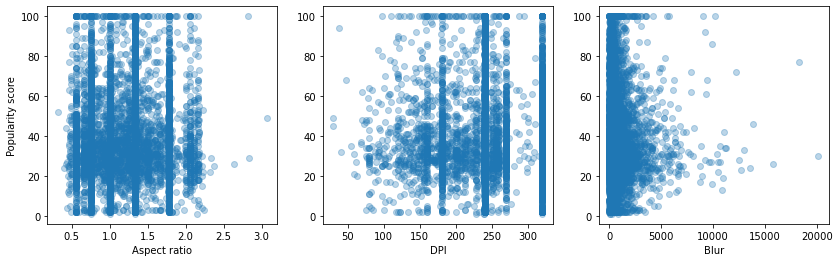

In [59]:
make_scatterplot(data, cols=['aspect_ratio', 'dpi', 'blur'], 
                 labels = ['Aspect ratio', 'DPI', 'Blur'])

**Hue, saturation and brightness:**

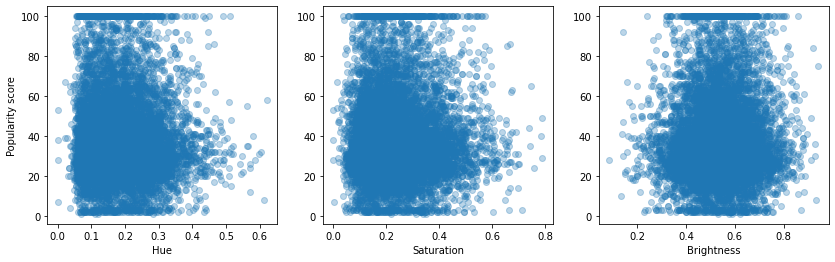

In [60]:
make_scatterplot(data, cols=['hue', 'saturation', 'brightness'], 
                 labels = ['Hue', 'Saturation', 'Brightness'])

**Warmth and contrast:**

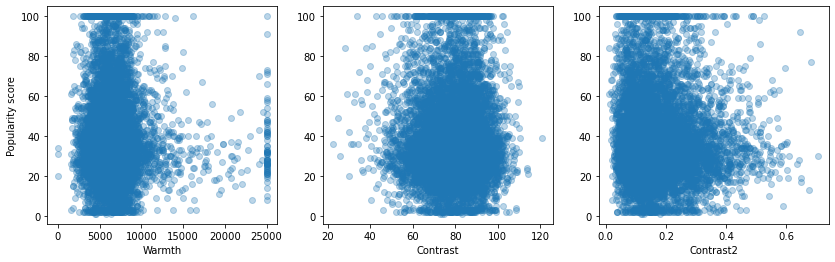

In [61]:
make_scatterplot(data, cols=['warmth', 'contrast', 'contrast2'], 
                 labels = ['Warmth', 'Contrast', 'Contrast2'])

## SAVE DATA WITH ADDED FEATURES:

In [ ]:
# Remove height, width:
data = data.drop(columns=['height', 'width'])

# Reorder columns:
data = data[['Id', 'Subject Focus', 'Eyes', 'Face', 'Near', 'Action', 'Accessory', 
             'Group', 'Collage', 'Human', 'Occlusion', 'Info', 'Blur', 'hue', 
             'saturation', 'brightness', 'contrast', 'contrast2', 'blur', 'warmth', 
             'aspect_ratio', 'dpi', 'white', 'light_grey', 'grey', 'black', 'brown', 
             'orange', 'green', 'lime', 'dark_green', 'cyan', 'teal', 'blue', 'violet', 
             'purple', 'dark_red', 'red', 'Pawpularity']]

# SAVE DATA WITH ADDED FEATURES:
data.to_csv(path_to_data + "train2.csv", sep=',', encoding = "UTF-8", index = False)

In [ ]:
## LOAD DATA WITH ADDED FEATURES: 
## path_to_data = "petfinder-pawpularity-score//"
## path_to_data = "input//"
#data = pd.read_csv(path_to_data + "train2.csv", delimiter=',', encoding = "UTF-8")

## How good are added features compared to original ones?

In [64]:
def mean_error(test_y, preds):
    # assuming y and y_pred are numpy arrays
    rmse = mean_squared_error(test_y, preds, squared = False)
    return -rmse

def make_regression(X,y):
    regr = RandomForestRegressor(random_state=0)
    mean_error_scorer = make_scorer(mean_error, greater_is_better=False)
    scores = cross_val_score(regr, X, y, scoring=mean_error_scorer)
    # [20.88841628, 20.98779094, 21.02254736, 20.34309572, 20.60567174]    
    return scores.mean() #  20.769 (1- perfect fit, 0- worst)

y = data['Pawpularity']

**Existing features:**

In [ ]:
X = data[['Subject Focus', 'Eyes', 'Face', 'Near', 'Action', 'Accessory', 'Group', 
          'Collage', 'Human', 'Occlusion', 'Info', 'Blur']] 
print(make_regression(X,y)) # 20.76950440932938

**Added features (except colors):**

In [ ]:
X = data[['hue', 'saturation', 'brightness', 'contrast', 'contrast2', 'blur',
          'warmth', 'aspect_ratio', 'dpi']]  
print(make_regression(X,y)) # 21.020323605693214

**Added features (only colors):**

In [ ]:
X = data[['white', 'light_grey', 'grey', 'black', 'brown', 'orange', 'green', 
          'lime', 'dark_green', 'cyan', 'teal', 'blue', 'violet', 'purple', 
          'dark_red', 'red']]
print(make_regression(X,y)) # 20.907879530446497

**All added features (colors and others):**

In [ ]:
X = data[['hue', 'saturation', 'brightness', 'contrast', 'contrast2', 'blur', 
          'warmth', 'aspect_ratio', 'dpi' , 'white', 'light_grey', 'grey',
          'black', 'brown', 'orange', 'green', 'lime', 'dark_green', 'cyan', 
          'teal', 'blue', 'violet', 'purple', 'dark_red', 'red']]
print(make_regression(X,y)) # 20.873154066943037

**Both existing and added features:**

In [ ]:
X = data.drop(columns = ['Pawpularity', 'Id'])
print(make_regression(X,y)) # 20.854336209859447

## Feature importances (without cross-validation):

In [65]:
def get_feature_importances(X, data):
    trainX, testX = X[:8000], X[8000:]
    train_y, test_y = data['Pawpularity'][:8000], data['Pawpularity'][8000:]
    regr = RandomForestRegressor(random_state=0)
    regr.fit(trainX, train_y)
    preds = regr.predict(testX)
    rmse = mean_squared_error(test_y, preds, squared = False)  # 20.987398005762916
    feat_importances = regr.feature_importances_
    feats = trainX.columns.tolist()
    feats_df = pd.DataFrame(data = [feats, feat_importances]).T
    feats_df.columns = ['Feature', 'Importance']
    feats_df = feats_df.sort_values(by = ['Importance'], ascending = False)
    return feats_df

y = data['Pawpularity']

**Both existing and added features:**

In [71]:
X = data.drop(columns = ['Pawpularity', 'Id'])
print(get_feature_importances(X, data))

          Feature Importance
17           blur   0.055055
16      contrast2   0.052411
22     light_grey   0.052212
25          brown    0.05064
21          white    0.05047
14     brightness   0.048909
27          green   0.048552
12            hue   0.047683
23           grey    0.04732
26         orange   0.046307
15       contrast   0.046101
24          black   0.045903
35       dark_red   0.044024
13     saturation   0.041786
18         warmth   0.041337
31           teal    0.04058
33         violet   0.039792
29     dark_green   0.036703
19   aspect_ratio   0.032346
36            red   0.022763
20            dpi   0.020287
32           blue   0.019217
28           lime   0.015494
30           cyan   0.009081
34         purple   0.006695
1            Eyes   0.005073
9       Occlusion   0.003981
6           Group   0.003881
8           Human   0.003843
3            Near    0.00355
5       Accessory   0.003238
2            Face   0.003164
11           Blur   0.002686
7         Coll